# (05) Laplace—MNIST—0

**Motivation**: Laplace + MNIST. Device = ```cuda:0``` <br>

In [1]:
# HIDE CODE


import os, sys
from IPython.display import display

# tmp & extras dir
git_dir = os.path.join(os.environ['HOME'], 'Dropbox/git')
extras_dir = os.path.join(git_dir, 'jb-vae/_extras')
fig_base_dir = os.path.join(git_dir, 'jb-vae/figs')
tmp_dir = os.path.join(git_dir, 'jb-vae/tmp')

# GitHub
sys.path.insert(0, os.path.join(git_dir, '_PoissonVAE'))
from analysis.eval import sparse_score
from figures.fighelper import *
from vae.train_vae import *

# warnings, tqdm, & style
warnings.filterwarnings('ignore', category=DeprecationWarning)
from rich.jupyter import print
%matplotlib inline
set_style()

In [2]:
device_idx = 0
device = f'cuda:{device_idx}'

model_type = 'laplace'

## CONV + FF

In [3]:
cfg_vae, cfg_tr = default_configs('MNIST', model_type, 'conv+b|conv+b')
print(f"VAE:\n{cfg_vae}\n\nTrainer:\n{cfg_tr}")

VAE:
{'dataset': 'MNIST', 'n_ch': 32, 'n_latents': 10, 'latent_act': None, 'fit_prior': False, 'enc_type': 'conv', 
'dec_type': 'conv', 'enc_bias': True, 'dec_bias': True}

Trainer:
{'temp_anneal_portion': 0.0, 'temp_anneal_type': 'lin', 'temp_start': 1.0, 'temp_stop': 1.0, 'lr': 0.002, 'epochs':
1000, 'batch_size': 200, 'warm_restart': 2, 'optimizer_kws': {'weight_decay': 0.0003}, 'grad_clip': 1000}

+-------------+------------+
| Module Name | Num Params |
+-------------+------------+
|  LaplaceVAE |  6.2 Mil   |
|     ---     |    ---     |
|     stem    |    352     |
|     enc     |  4.9 Mil   |
|    fc_enc   |   5.1 K    |
|    fc_dec   |   11.3 K   |
|     dec     |  1.2 Mil   |
+-------------+------------+

laplace_None_MNIST_z-10_k-32_<conv+b|conv+b>
mc_b200-ep1000-lr(0.002)_beta(1:0x0.5)_gr(1000)_(2024_05_05,19:17)

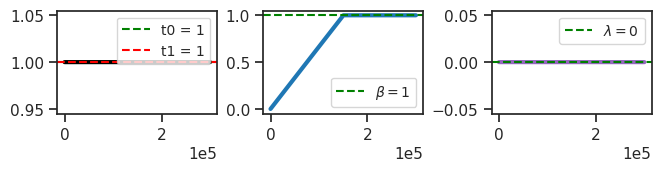

In [4]:
vae = MODEL_CLASSES[model_type](CFG_CLASSES[model_type](**cfg_vae))
tr = TrainerVAE(vae, ConfigTrainVAE(**cfg_tr), device=device)

vae.print()
print(f"{vae.cfg.name()}\n{tr.cfg.name()}_({vae.timestamp})\n")
tr.show_schedules()

In [5]:
vae.fc_dec.bias.shape, vae.fc_enc.bias.shape

(torch.Size([1024]), torch.Size([20]))

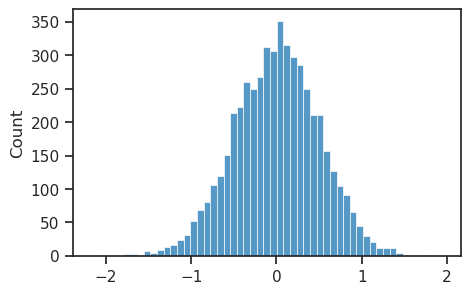

In [6]:
sns.histplot(tonp(vae.fc_enc.weight.data.ravel()));

In [7]:
vae.cfg.init_scale

0.5

In [8]:
tr.cfg.warmup_epochs

5

### Train

In [9]:
# comment = f"..._{tr.cfg.name()}"
comment = tr.cfg.name()
tr.train(comment=comment)

epoch # 1000, avg loss: 23.046668: 100%|██████████████████████| 1000/1000 [2:48:07<00:00, 10.09s/it]


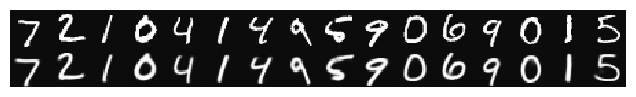

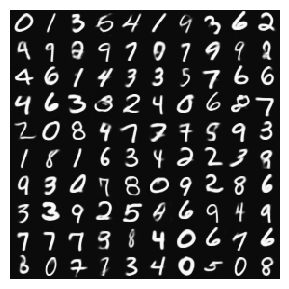

In [14]:
tr.show_recon(1.0), tr.show_samples(1.0);

### Loss vld

In [15]:
data, loss, etc = tr.validate()

_loss = {k: v.mean() for k, v in loss.items()}
_loss['tot'] = _loss['mse'] + _loss['kl']
print(_loss)

{'mse': 11.761028, 'kl': 13.736504, 'kl_diag': 1.3736502, 'tot': 25.497532}

In [16]:
vars(tr.cfg)

{'lr': 0.002,
 'epochs': 1000,
 'batch_size': 200,
 'warm_restart': 2,
 'warmup_epochs': 5,
 'optimizer': 'adamax_fast',
 'optimizer_kws': {'weight_decay': 0.0003,
  'betas': (0.9, 0.999),
  'eps': 1e-08},
 'scheduler_type': 'cosine',
 'scheduler_kws': {'T_max': 199.0, 'eta_min': 1e-05},
 'ema_rate': 0.999,
 'grad_clip': 1000,
 'chkpt_freq': 50,
 'eval_freq': 20,
 'log_freq': 10,
 'use_amp': False,
 'method': 'mc',
 'kl_beta': 1.0,
 'kl_beta_min': 0.0001,
 'kl_anneal_cycles': 0,
 'kl_anneal_portion': 0.5,
 'kl_const_portion': 0.0001,
 'lambda_anneal': False,
 'lambda_init': 0.0,
 'lambda_norm': 0.0,
 'temp_anneal_portion': 0.0,
 'temp_anneal_type': 'lin',
 'temp_start': 1.0,
 'temp_stop': 1.0}

In [17]:
vars(vae.cfg)

{'latent_act': None,
 'fit_prior': False,
 'type': 'laplace',
 'enc_type': 'conv',
 'dec_type': 'conv',
 'enc_bias': True,
 'dec_bias': True,
 'dataset': 'MNIST',
 'input_sz': 28,
 'n_ch': 32,
 'n_latents': 10,
 'weight_norm': False,
 'use_bn': False,
 'use_se': True,
 'res_eps': 1.0,
 'activation_fn': 'swish',
 'init_scale': 0.5,
 'seed': 0,
 'base_dir': '/home/hadi/Projects/PoissonVAE',
 'results_dir': '/home/hadi/Projects/PoissonVAE/results',
 'runs_dir': '/home/hadi/Projects/PoissonVAE/runs/gaussian_None_MNIST_z-10_k-32_<conv+b|conv+b>',
 'save_dir': '/home/hadi/Projects/PoissonVAE/models/gaussian_None_MNIST_z-10_k-32_<conv+b|conv+b>',
 'data_dir': '/home/hadi/Datasets'}

### Identify dead neurons

In [18]:
dead_thres = 0.0
dead = loss['kl_diag'] < dead_thres
dead.sum()

0

In [19]:
loss['kl_diag']

array([0.6360022 , 1.3851999 , 1.0161119 , 1.5450675 , 1.6228402 ,
       1.2757624 , 1.3781732 , 0.39399433, 2.2579339 , 2.2254171 ],
      dtype=float32)

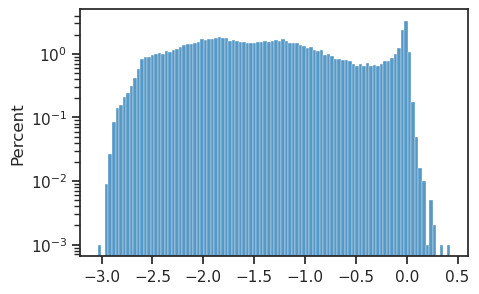

In [28]:
ax = sns.histplot(np.log(etc['scale'][:, ~dead].ravel()), stat='percent', bins=100)
ax.set_yscale('log')

In [29]:
def _show_pairwise(i, j):
    df = pd.DataFrame({
        f'z-{i}': etc['scale'][:, i],
        f'z-{j}': etc['scale'][:, j],
        f'z-{i}_log': np.log(etc['scale'][:, i]),
        f'z-{j}_log': np.log(etc['scale'][:, j]),
        'lbl': tonp(tr.dl_vld.dataset.tensors[1]).astype(int),
    })
    fig, axes = create_figure(1, 2, (8, 4.5), layout='constrained')
    sns.scatterplot(data=df, x=f'z-{i}', y=f'z-{j}', hue='lbl', palette='tab10', s=20, ax=axes[0])
    sns.scatterplot(data=df, x=f'z-{i}_log', y=f'z-{j}_log', hue='lbl', palette='tab10', s=5, legend=False, ax=axes[1])
    axes[1].axvline(0, color='k', ls='--', lw=1.0, zorder=0)
    axes[1].axhline(0, color='k', ls='--', lw=1.0, zorder=0)
    ax_square(axes)
    plt.show()

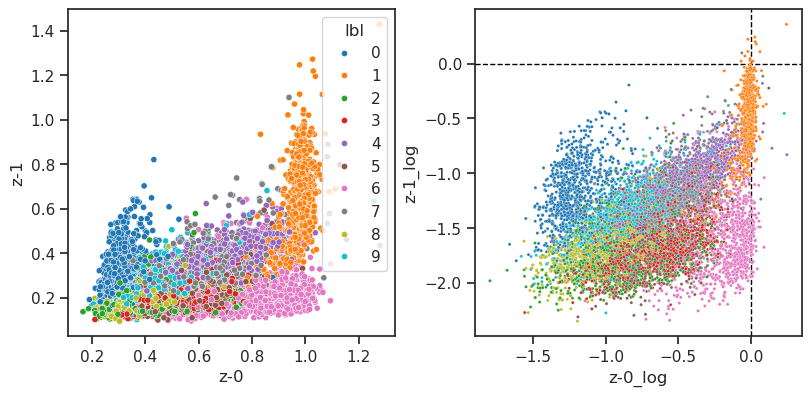

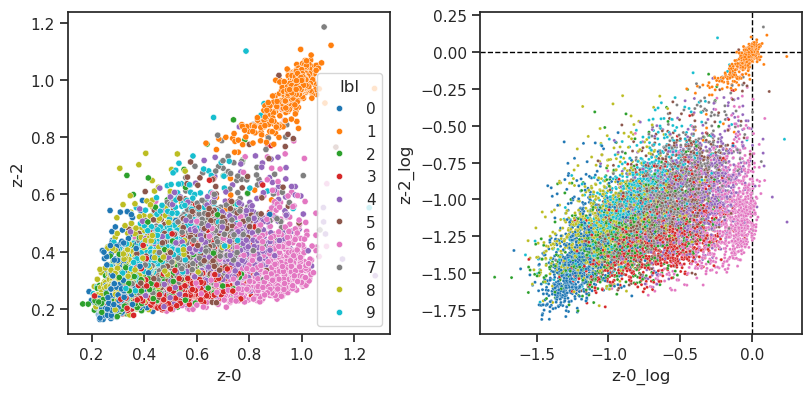

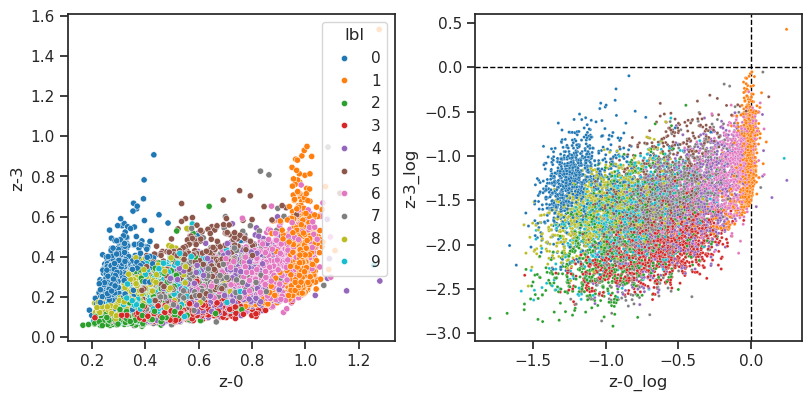

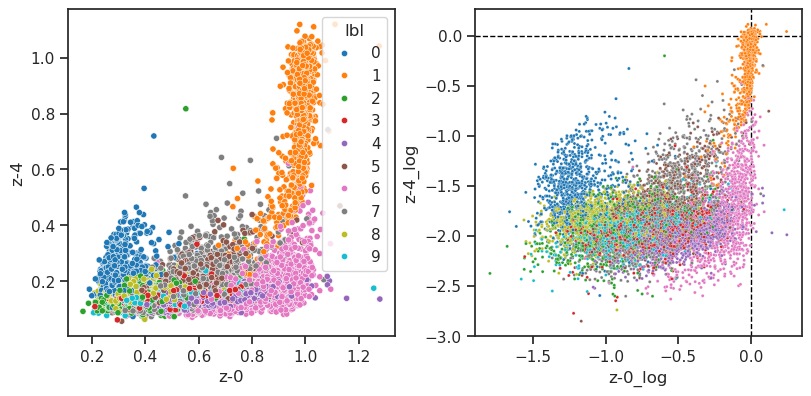

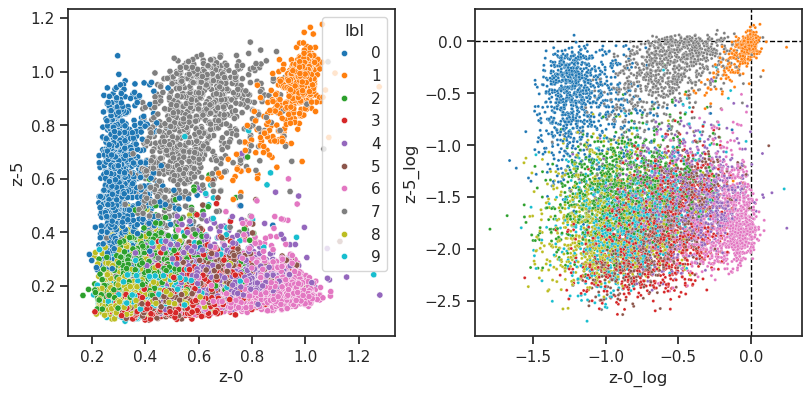

...

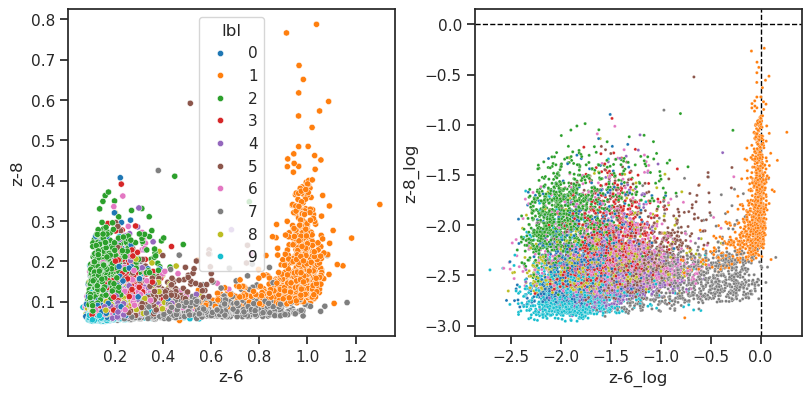

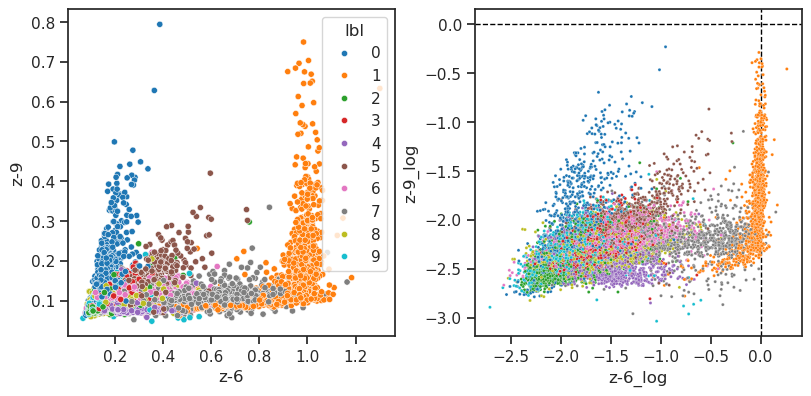

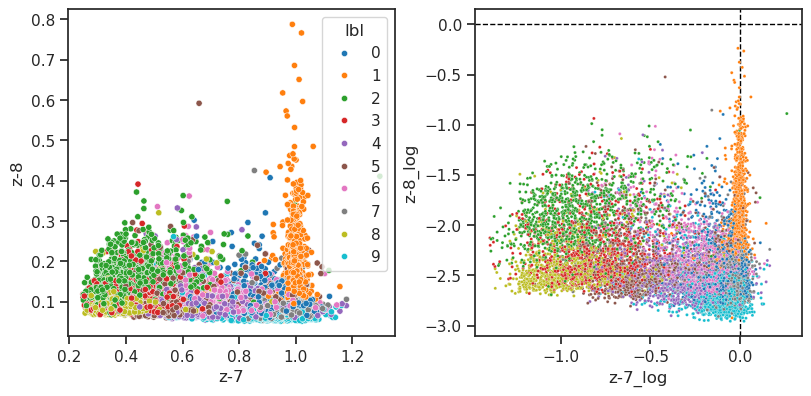

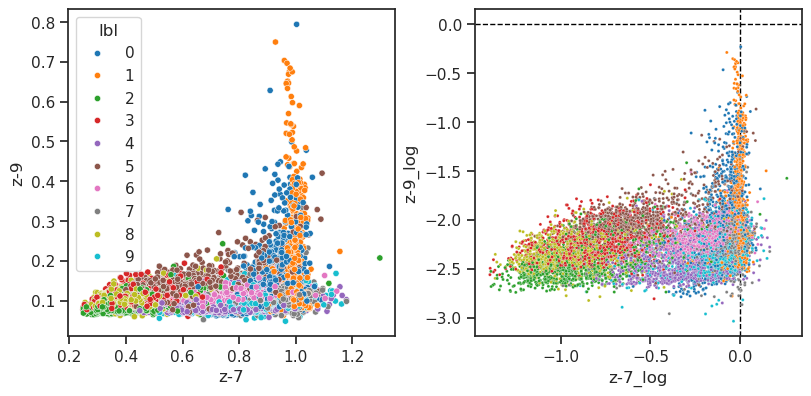

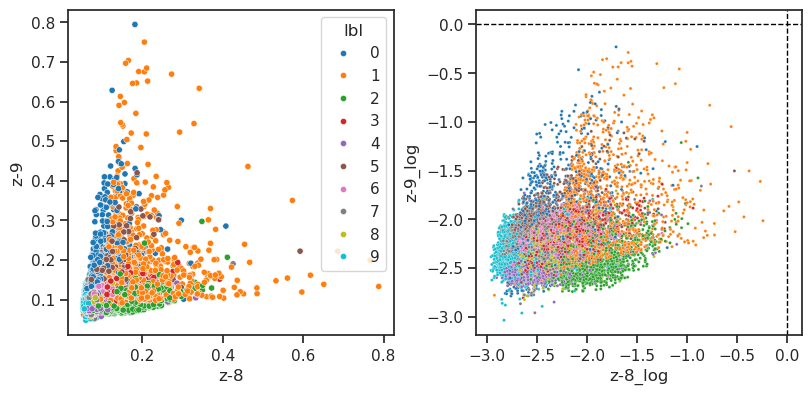

In [30]:
for i, j in list(itertools.combinations(
    range(tr.model.cfg.n_latents), 2)):
    _show_pairwise(i, j)

<Axes: ylabel='Count'>

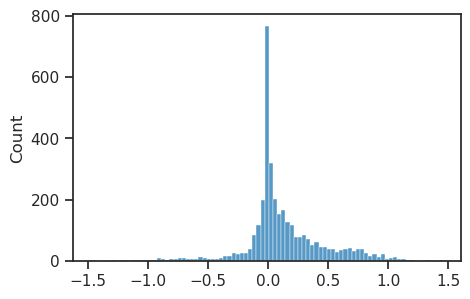

In [31]:
sns.histplot(tonp(torch.cat(vae.all_lognorm)))

In [32]:
(np.array(list(tr.stats['grad'].values())) > 500).sum() / len(tr.stats['grad'])

0.0014533333333333334

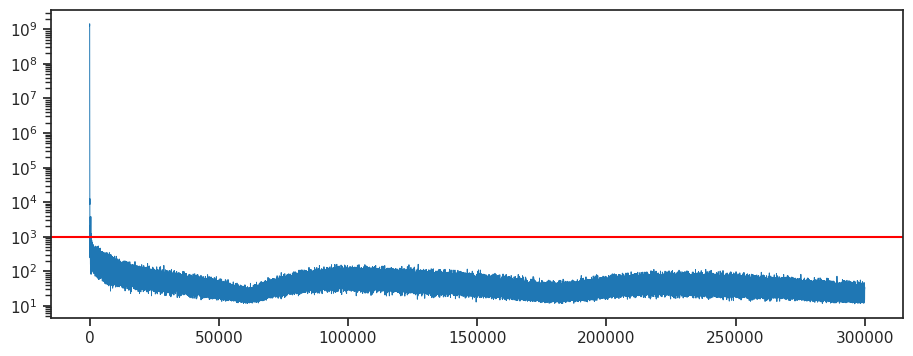

In [33]:
fig, ax = create_figure(1, 1, (11, 4))
plt.plot(tr.stats['grad'].keys(), tr.stats['grad'].values(), lw=0.7)
ax.axhline(tr.cfg.grad_clip, color='r')
ax.set(yscale='log')
plt.show()

In [36]:
df, df_summary = knn_analysis(
    x=etc['loc'],
    y=tonp(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 20, iter #0:   0%|                             | 0/801 [00:00<?, ?it/s]/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

In [37]:
df_summary

,mean,std
size,,
20,0.335008,0.057717
50,0.546092,0.060123
100,0.680808,0.040207
200,0.777444,0.022531
500,0.850320,0.010542
1000,0.888036,0.007526
2000,0.914216,0.004552
4000,0.934382,0.002502
5000,0.940200,NaN


In [38]:
df, df_summary = knn_analysis(
    x=np.log(etc['scale']),
    y=tonp(tr.dl_vld.dataset.tensors[1]),
    n_iter=100,
    verbose=True,
)

train sample size: 20, iter #0:   0%|                             | 0/801 [00:00<?, ?it/s]/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/hadi/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  

In [40]:
df_summary

,mean,std
size,,
20,0.380996,0.063459
50,0.628890,0.052139
100,0.753422,0.030042
200,0.824242,0.018848
500,0.877170,0.009263
1000,0.901914,0.006460
2000,0.918988,0.003802
4000,0.932396,0.002034
5000,0.935200,NaN
